#Decision Trees 1
**Lecture** **link**: https://www.scaler.com/meetings/i/dsml-advanced-decision-tree-2/archive

## Content:

* Agenda (00:00 - 5:20)
* Credit card fraud detection problem (5:20 - 1:31:00)
* Alternative metrics for imbalanced data
  * Brier-score
  * G-mean
* Type of Data Splitting
* Correlation Between Features
* Decision tree (01:54:00- last)






<img src='https://drive.google.com/uc?id=18FRxl3a5yR3SXcmoYSkM8oJlwrmCfHJL'>



## Credit card fraud detection problem



*   This problem is about credit card fraud detection.
*   Many financial institutes run machine learning algorithm to find whether the transaction is fraudulent.
* Let's implement the same.




First, let's import the libraries needed.


In [ ]:
!pip install pendulum

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 155 kB 16.4 MB/s 
     |████████████████████████████████| 489 kB 53.6 MB/s 


This library makes **date and time** based operations very **easy**

In [ ]:
!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 69 kB 6.0 MB/s 


* This library helps you to do all categorical encoding.
* can be used in implementaion of target encoding.


In [ ]:
import pandas as pd
import numpy as np
from numpy import argmax
from datetime import date, time, timedelta
import pendulum # for time formatting
import matplotlib.pyplot as plt
import seaborn as sns
import category_encoders as ce # for categorical encoding
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score , f1_score, precision_recall_curve

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


We have already seen the usage of all above libraries and functions
* argmax function in numpy is used to get the index value of highest term in an array.

Now, let's download the data and read it.

In [ ]:
!wget "https://drive.google.com/uc?export=download&id=1HC7MfMyg4KphO51bc21JKIxeubmcl8C_" -O orders.csv

--2023-10-10 09:11:05--  https://drive.google.com/uc?export=download&id=1HC7MfMyg4KphO51bc21JKIxeubmcl8C_
Resolving drive.google.com (drive.google.com)... 74.125.142.102, 74.125.142.101, 74.125.142.138, ...
Connecting to drive.google.com (drive.google.com)|74.125.142.102|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2023-10-10 09:11:05 ERROR 404: Not Found.



In [ ]:
df = pd.read_csv('orders.csv', error_bad_lines=False)

In [ ]:
df.head()

In [ ]:
df.info()

In [ ]:
df.columns

Let's check for the Fraudulent Count

In [ ]:
df["is_fraudulent"].value_counts()

In [ ]:
df.nunique() # unique values per feature

Now, We will drop the coloumns that are either have unique/same value for each row or are identical to some other coloumn

In [ ]:
# dropping product_name as we have product_id
df = df.drop(columns=["order_id", "payment_method", "payment_id", "product_name"])
df.head()

In [ ]:
df.shape

Here, Let's drop all the duplicate value as they are of no good to us.

In [ ]:
# drop duplicates
if df.shape[0] == df.drop_duplicates().shape[0] :
    print('No duplicates Found')
else:
    duplicates = df.shape[0] - df.drop_duplicates().shape[0]
    print('{} duplicates found'.format(duplicates))

In [ ]:
df = df.drop_duplicates()

In [ ]:
#NAN values
df.isna().sum()

As we can see that we have a lot of NAN value for 'payment_method_issuer_bank','payment_method_product', 'payment_method_card_category', we will drop them right away

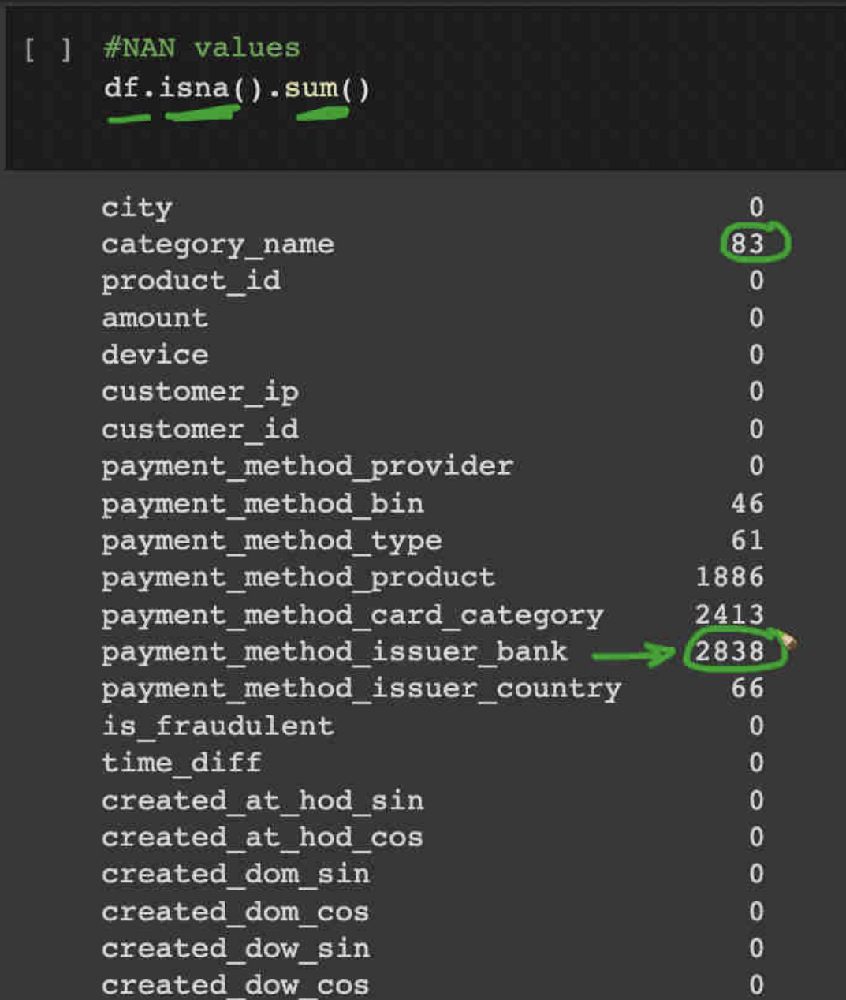

In [ ]:
df = df.dropna(axis = 0, how= 'any',
               subset = ['payment_method_issuer_bank','payment_method_product', 'payment_method_card_category'])

In [ ]:
df.isna().sum()

Now, for 'category_name' and 'payment_method_issuer_country' NAN vales are significantly low, So instead of removing dropping these. We can simply assign them a different value. Let's say we give them a value 'other'

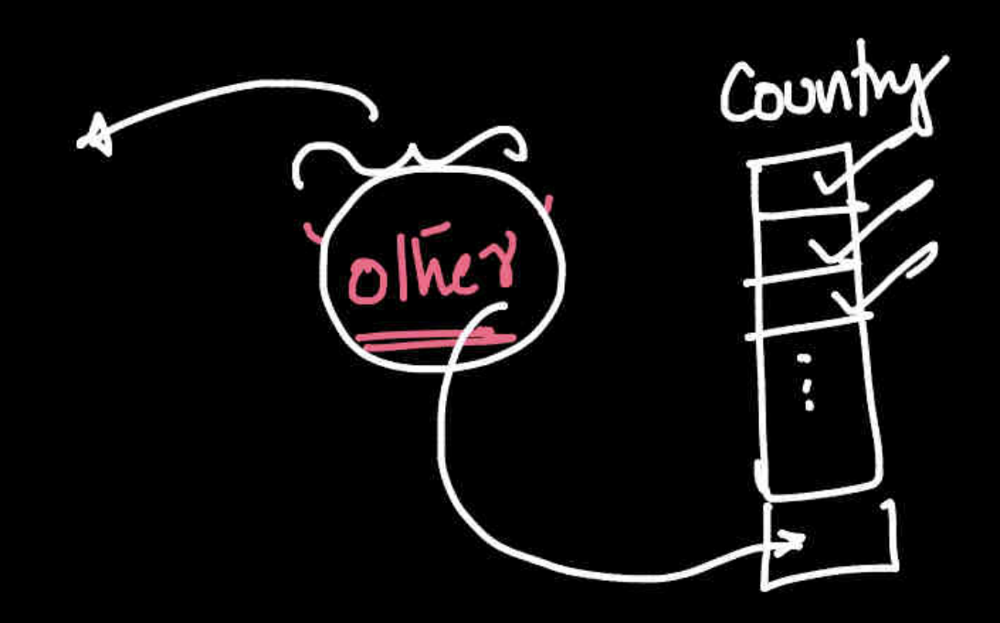

In [ ]:
df['category_name']

In [ ]:
# fill other for catgeory_name=null
df['category_name'] = df['category_name'].fillna('other')

In [ ]:
df['payment_method_issuer_country']

In [ ]:
df['payment_method_issuer_country'] = df['payment_method_issuer_country'].fillna('other')

In [ ]:
df.isna().sum()

Now we had two ways to deal with NAN values
*   Dropping
*   Imputation

> Only way to decide which one is better, is to try both and choose the one which performs better

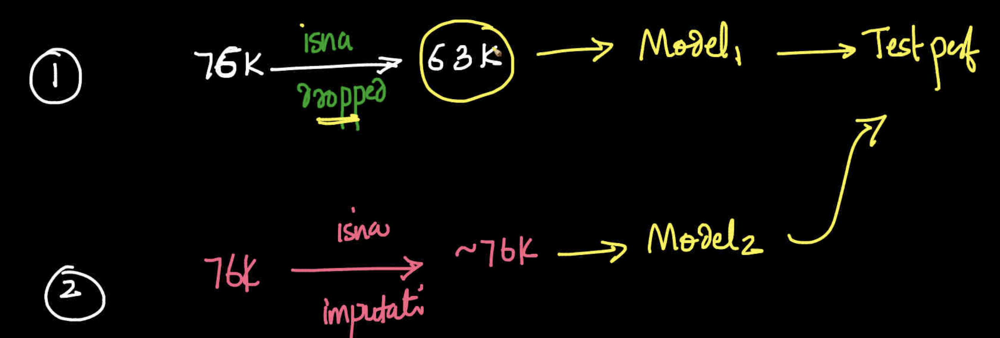

Now, if we have a NAN value during testing, We will apply the imputations as such
*   Numerical -> Mean/Median
*   Categorical -> Mode

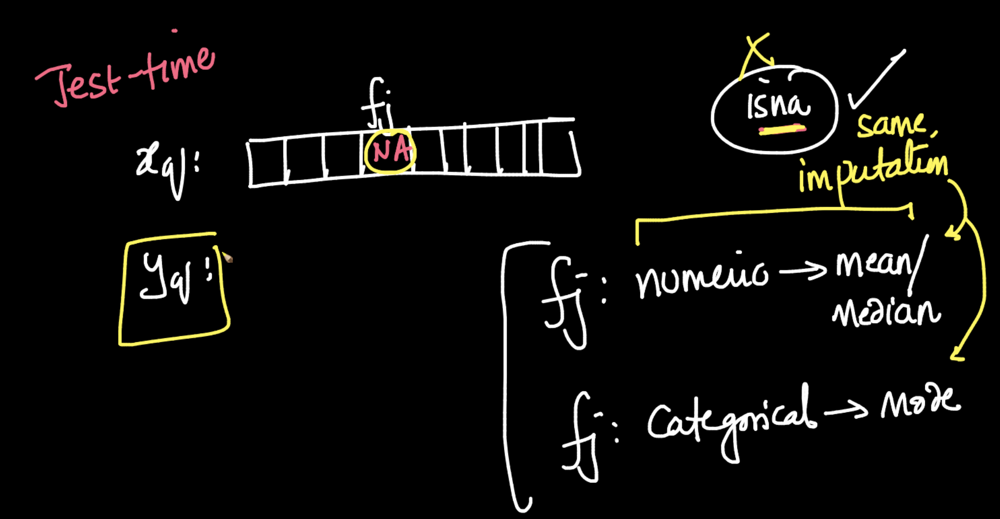

> Imputation values must be calculated only using the train data and then those values should be used in cross validation as well as testing data.

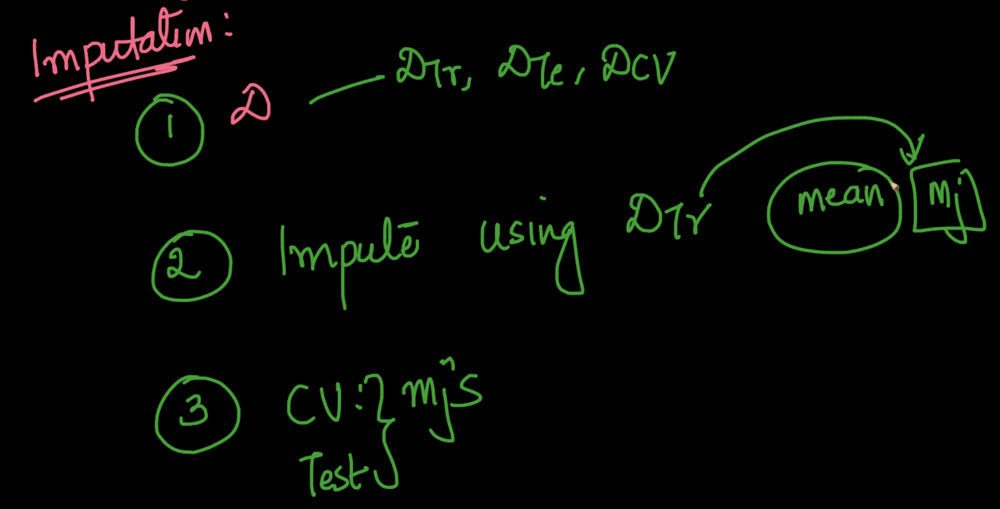

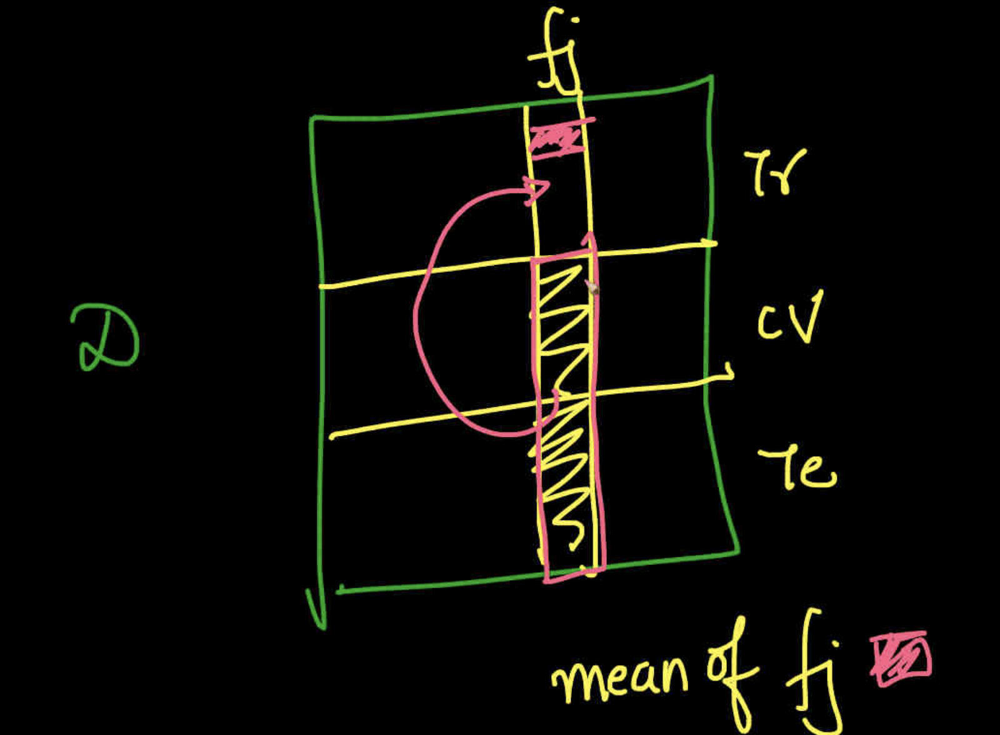

In [ ]:
# Dataset
X = df.drop(['is_fraudulent'], axis = 1)
y = df['is_fraudulent']

In [ ]:
# Train, CV, test split
from sklearn.model_selection import train_test_split
#0.6, 0.2, 0.2 split

X_tr_cv, X_test, y_tr_cv, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_tr_cv, y_tr_cv, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

In [ ]:
X_train.head()

Now Let's get the categorical columns and use target encoding to convert them into numerical data.

In [ ]:
set(X.columns) - set(X.select_dtypes(['number']).columns)

In [ ]:
# Target encoding using mean
ce_target = ce.TargetEncoder(cols = ['category_name','city','customer_id','customer_ip','device','payment_method_card_category','payment_method_issuer_bank','payment_method_issuer_country','payment_method_product','payment_method_provider','payment_method_type'])
X_train = ce_target.fit_transform(X_train, y_train)

We will apply the same conversation on Validation and Testing data too.

In [ ]:
X_val = ce_target.transform(X_val)
X_test = ce_target.transform(X_test)

In target encoding we come across this, Even tho $c_2$ has a higher probability but spread is very low.

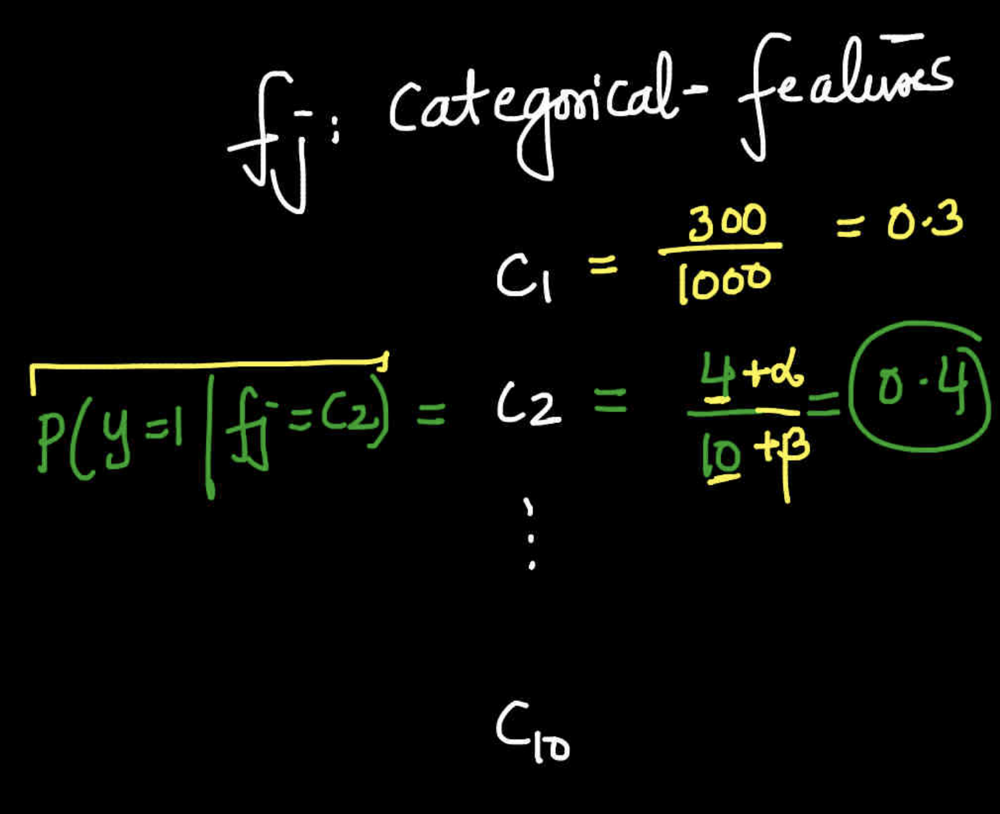

To fix such cases, we use the following smoothing technique

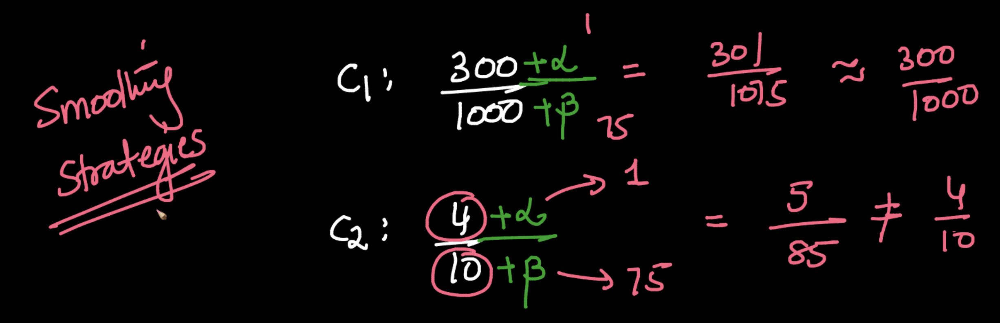

In [ ]:
# Hyper-pram tuning without any rebalancing
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

train_scores = []
val_scores = []
scaler = StandardScaler()
l=0.01
h= 1000.0
d=50.0

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la))
  scaled_lr.fit(X_train, y_train)
  train_y_pred = scaled_lr.predict(X_train)
  val_y_pred = scaled_lr.predict(X_val)
  train_score = f1_score(y_train, train_y_pred)
  val_score = f1_score(y_val, val_y_pred)
  train_scores.append(train_score)
  val_scores.append(val_score)

plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1-Score")
plt.grid()
plt.show()

we get a highest F1-score of about 0.425 with no rebalancing.

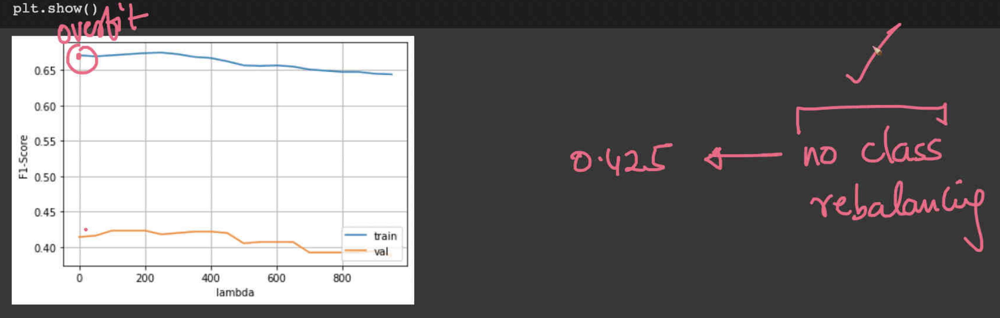

In [ ]:
# minority class needs more re-weighting

# Hyper-pram tuning
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

train_scores = []
val_scores = []
scaler = StandardScaler()
l=0.01
h= 1000.0
d=50.0

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la, class_weight={ 0:0.1, 1:0.9 }))
  scaled_lr.fit(X_train, y_train)
  train_y_pred = scaled_lr.predict(X_train)
  val_y_pred = scaled_lr.predict(X_val)
  train_score = f1_score(y_train, train_y_pred)
  val_score = f1_score(y_val, val_y_pred)
  train_scores.append(train_score)
  val_scores.append(val_score)

#plotting
plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1-Score")
plt.grid()
plt.show()

we get a highest F1-score of about 0.55 with 1:9 weight rebalancing.

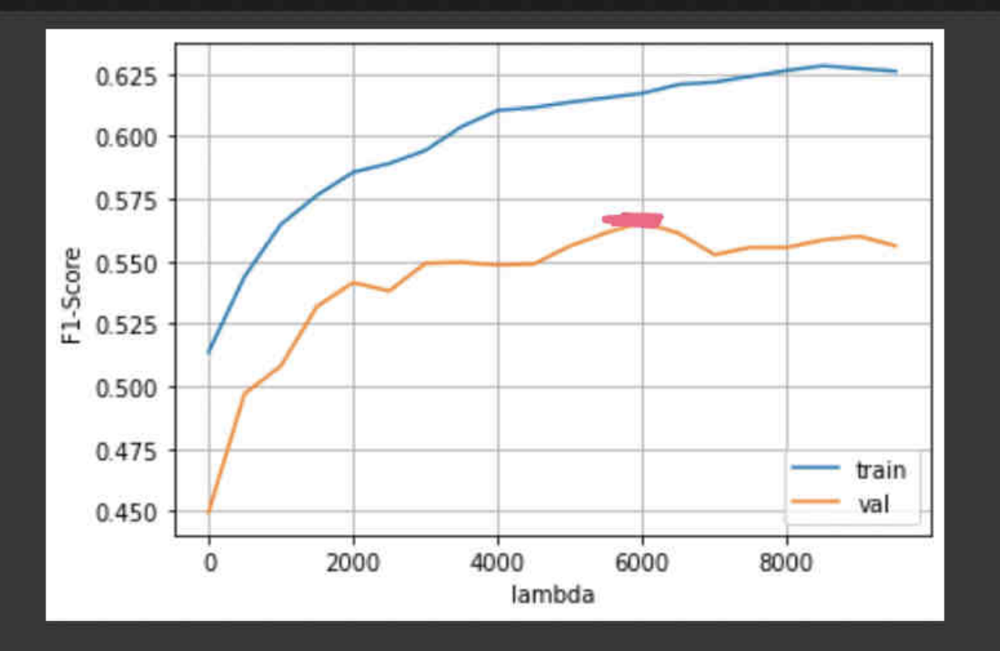

In [ ]:
# minority class needs more weighting

# Hyper-pram tuning
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

train_scores = []
val_scores = []
scaler = StandardScaler()
l=0.01
h= 10000.0 # change to 10000.0
d=500.0 # change to 500.0

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la, class_weight={ 0:0.01, 1:0.75 }))
  scaled_lr.fit(X_train, y_train)
  train_y_pred = scaled_lr.predict(X_train)
  val_y_pred = scaled_lr.predict(X_val)
  train_score = f1_score(y_train, train_y_pred)
  val_score = f1_score(y_val, val_y_pred)
  train_scores.append(train_score)
  val_scores.append(val_score)

#plotting
plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1-Score")
plt.grid()
plt.show()

we get a highest F1-score of about 0.565 with 1:75 weight rebalancing.

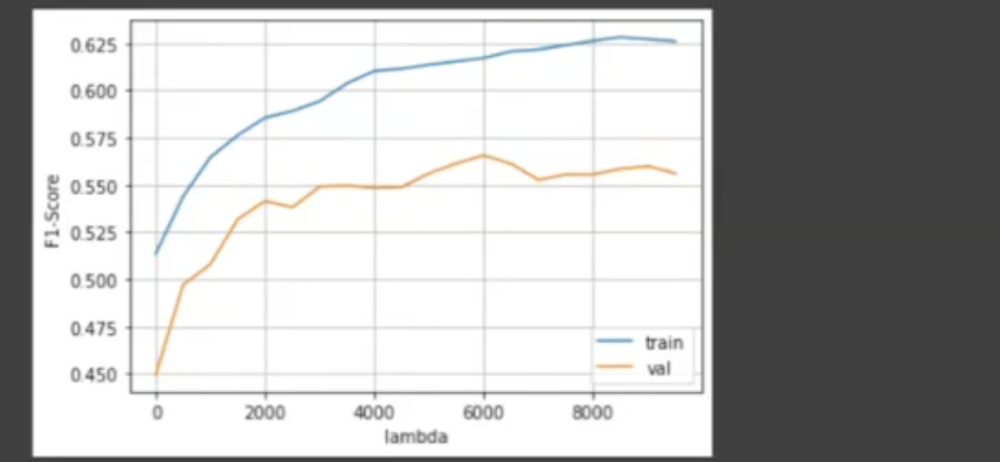

In [ ]:
best_idx = np.argmax(val_scores)
print(val_scores[best_idx])

0.6283662477558348


In [ ]:
# Model with lambda_best
best_idx = np.argmax(val_scores)
l_best = l+d*best_idx
scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/l_best, class_weight={ 0:0.01, 1:0.75 }))
scaled_lr.fit(X_train, y_train)

y_pred_test = scaled_lr.predict(X_test)
test_score = f1_score(y_test, y_pred_test)

print(test_score)


0.6007751937984496


Let's look at this confusion matrix for the data.

In [ ]:
confusion_matrix(y_test, y_pred_test)

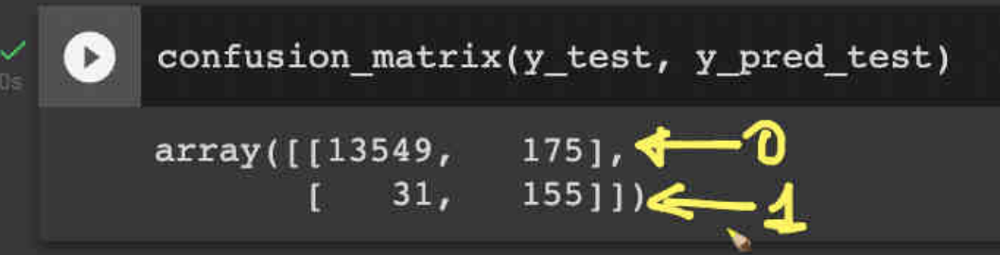

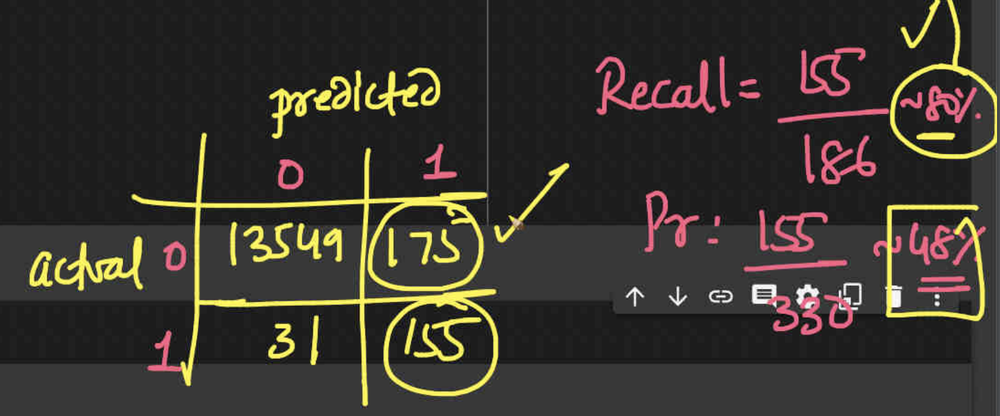

> we should always aim for high recall but discarding precision is not a good practice either.

In [ ]:
# minority class needs more weighting

# Hyper-pram tuning
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

train_scores = []
val_scores = []
scaler = StandardScaler()
l=0.01
h= 10000.0 # change to 10000.0
d=500.0 # change to 500.0

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la, class_weight={ 0:0.001, 1:0.2 }))
  scaled_lr.fit(X_train, y_train)
  train_y_pred = scaled_lr.predict(X_train)
  val_y_pred = scaled_lr.predict(X_val)
  train_score = f1_score(y_train, train_y_pred)
  val_score = f1_score(y_val, val_y_pred)
  train_scores.append(train_score)
  val_scores.append(val_score)

#plotting
plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1-Score")
plt.grid()
plt.show()

we get the following result with 1:200 weight rebalancing.

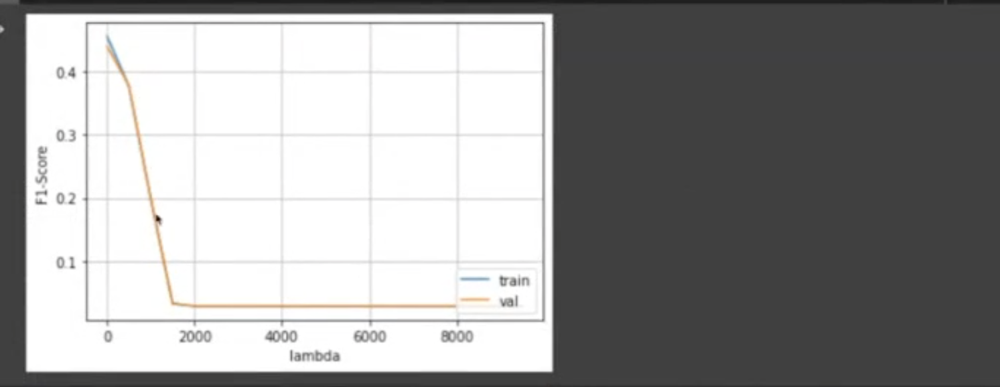

##Alternative metrics for imbalanced data.
* AUC(ROC) [we will cover it later]
* Brier-Score
* G-mean

### Brier-Score

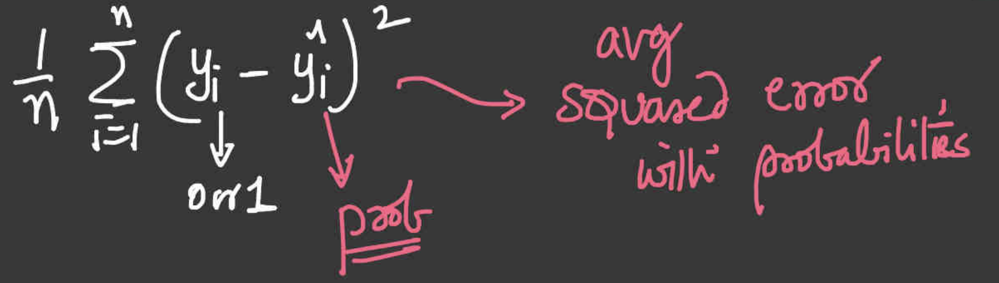

### G-mean

 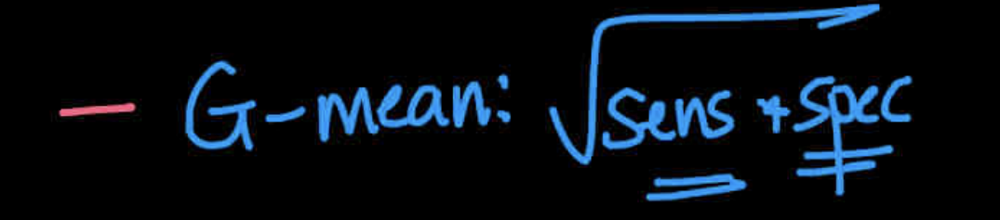

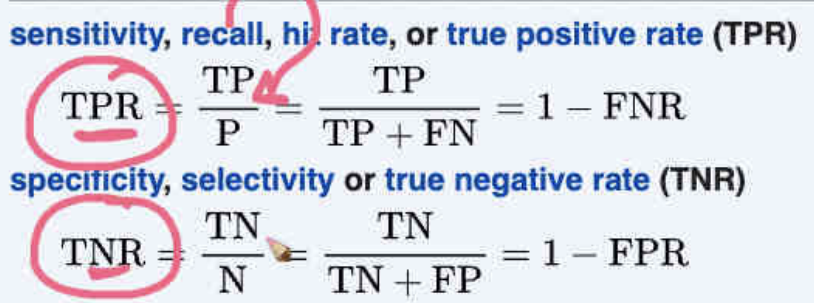

##Type of data splitting

* we split randomly.
* we do time-based spliting, as some data might get updated with time.

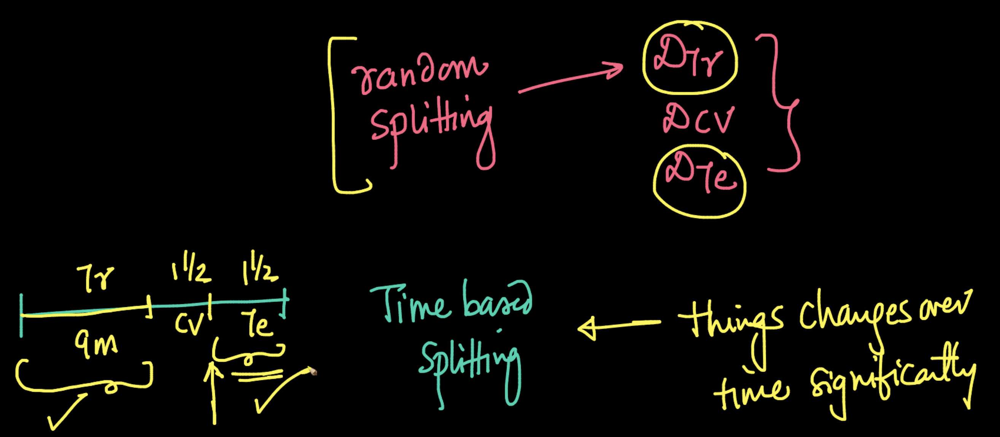

## Correlation between features
* Numerical vs Numerical : **Pearson and Spearman Rank Correlation Coefficient**

* Categorical vs Categorical : **χ² test**

* Numerical Vs Categorical : **Z-test and T-test**

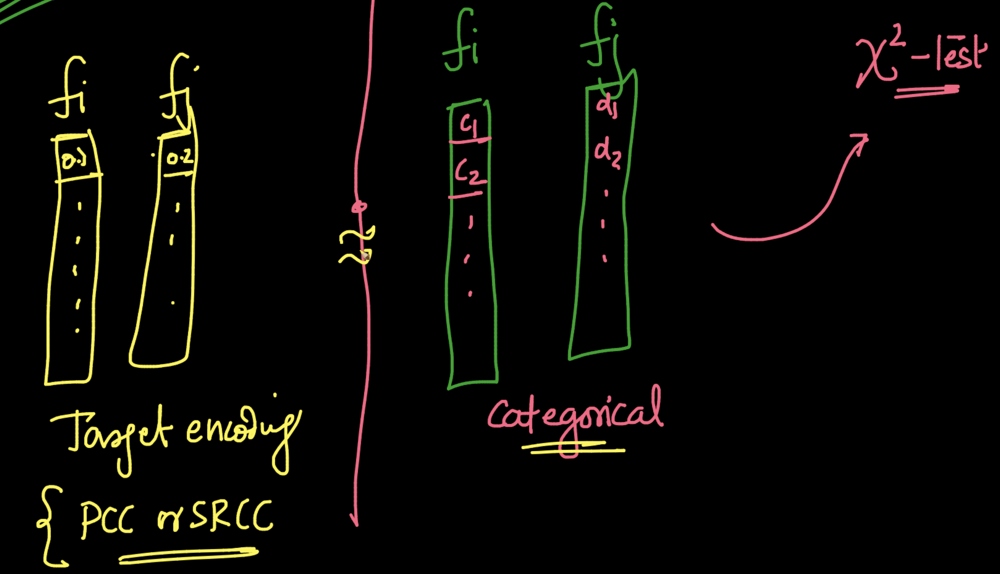

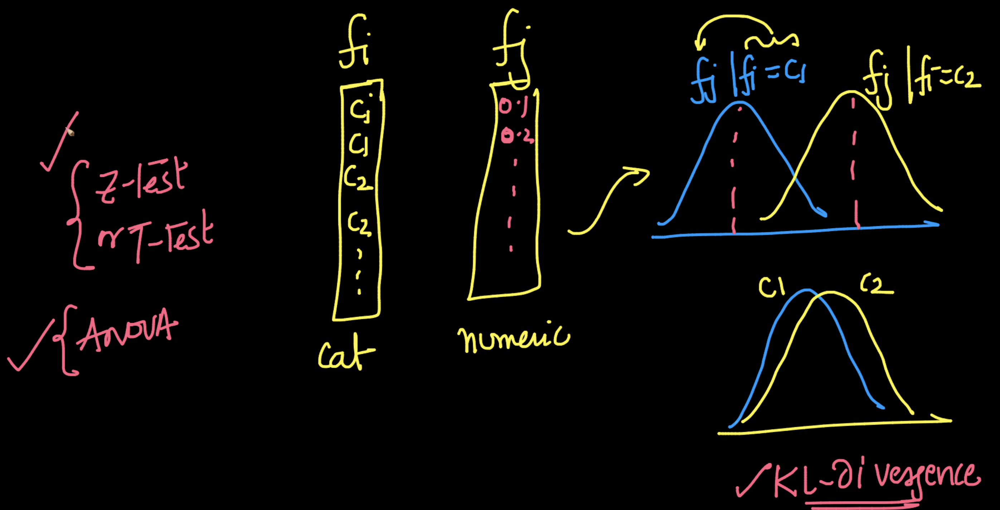

## Decision Tree

### Introduction:

What is Decision tree?
* Decision tree is a **tree like strcutured** model which the **data is split** coontinously basing on **certain parameter** that enables you to make decisions.

* Decision tree is one of the most important technique in machine learning.
* As it is the **foundation** for most used and most powerful techniques like **Random forest and GBDT** (Gradient Boosted Decision Tree).
* It can simply be stated as the application of **nested if-else statements** on each node of a tree.


**Terminology :**

* The node at which this process starts is calle as **Root Node**.
* The nodes which are at bottom are known as **Leaf Nodes**.
* All the non-leaf and non-root nodes are called as **Internal Nodes** .

<img src='https://drive.google.com/uc?id=1KxJmZVYnYFJFdSDD-OphK1NPjGlUwQ7w'>



* Every node makes a decision or  gives which class that belongs.
* It is called as **Binary Decision tree** as it splits into two at every node.
* **Geometrically** a decision tree is a **collection of Axis Parallel Hyper-planes,** which splits the data space.
* Even though it is a Rule based system, the rules are made automatically at every point. In selecting which feature to be used  and what is the threshold to be set.